# Statistic & Visualization for **letters pairs**

##About
---
There is a problem of decoding "ciphed" text, which is based on the number of occurrences of pairs of letters in "natural language text".

At this moment, we have received all possible `parity tables` that can be used to make calculations in the future. For their better understanding, it is necessary to make some visualization of the received data.

This notebook is intended directly for showing some statistics on the `parity tables`, as well as their visualization.

---
Є задача декодування "зашифрованого" тексту, яка базується на кількості частоти входжень пар літер в "natural language text".

На цей момент ми отримали всі можливі табліці по яких можна в подальшому робити обчислення. Для їх кращого розуміння треба зробити деяку візуалізацію отриманих даних.

Цей ноутбук призначений беспосередньо для відображення деякої статистики по таблицях пар, а також їх візуалізація.

---
---
## Import & mount

In [ ]:
import os
import re
import copy
import math
import random
from time import time
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

# plt.rcParams['figure.figsize'] = [15, 6]

In [ ]:
# Mount GitHub
!git clone https://github.com/EdwardGerman/Columnar-Transposition-Cipher.git  # clone repository
%ls  # checking whether all files are present
drch = '/content/Columnar-Transposition-Cipher' # Path to data

folder_pt = 'Parity_tables'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
title_font = {'family': 'serif',
              'color':  'darkred',
              'weight': 'bold',
              'size': 14,
              }

---
---
## Funcfions

In [ ]:
def display_df(df, name = True):
    pd.set_option('display.max_columns', None) # Print all rows (features) in DF
    if name == True and hasattr(df, 'name'): print(df.name + ':')
    display(df)
    print('\n')
    pd.reset_option('display.max_columns')     # Default setting: print print only first & final 5 rows

---
---
## Load DataFrame files

File list for DataFrame (table) files:

In [ ]:
# Get list of all files in directory
file_list = os.listdir(os.path.join(drch, folder_pt))
file_list

['data.csv',
 'Torah_Bereshit.csv',
 'Genetics_124.csv',
 'Chat_Comments.csv',
 'Asimov_I_Robot.csv',
 'Harry_Potter_I.csv',
 'News_articles.csv',
 'Hamlet_BB.csv',
 'Sci_articles.csv',
 'Log BQuant for All.csv',
 'Log BQuant without spaces.csv',
 'Log BFreq for All.csv',
 'Log BFreq without spaces.csv',
 'All texts.csv',
 'Freq for All.csv',
 'Quantit for All.csv',
 'Quantit without spaces.csv',
 'Freq without spaces.csv',
 'BQuant for All.csv',
 'BFreq for All.csv',
 'BQuant without spaces.csv',
 'BFreq without spaces.csv']

In [ ]:
freq_tables_list = ['Quantit for All.csv',
                    'Quantit without spaces.csv',
                    'Freq for All.csv',
                    'Freq without spaces.csv']

bias_tables_list = ['BQuant for All.csv',
                    'BQuant without spaces.csv',
                    'BFreq without spaces.csv',
                    'BFreq for All.csv']

log_tables_list =  ['Log BQuant for All.csv',
                    'Log BQuant without spaces.csv',
                    'Log BFreq for All.csv',
                    'Log BFreq without spaces.csv']

Read DFs from disk and write them to dict

In [ ]:
freq_tables = {}
bias_tables = {}
log_tables = {}

# For frequency tables
for df_file in freq_tables_list:
    table_name = df_file.replace('.csv', '')   # Only file name, without extension

    # Read:
    path_pt = os.path.join(drch, folder_pt, df_file)
    freq_tables[table_name] = pd.read_csv(path_pt)
    freq_tables[table_name].name = table_name

# For biased tables
for df_file in bias_tables_list:
    table_name = df_file.replace('.csv', '')   # Only file name, without extension

    # Read:
    path_pt = os.path.join(drch, folder_pt, df_file)
    bias_tables[table_name] = pd.read_csv(path_pt)
    bias_tables[table_name].name = table_name

# For logarithmic tables
for df_file in log_tables_list:
    table_name = df_file.replace('.csv', '')   # Only file name, without extension

    # Read:
    path_pt = os.path.join(drch, folder_pt, df_file)
    log_tables[table_name] = pd.read_csv(path_pt)
    log_tables[table_name].name = table_name

---
---
## Statistics

Quantitativity and frequency tables with value sums:

In [ ]:
for name in freq_tables:
    print(name,':\n','  Sum of values - ', freq_tables[name].values.sum(), sep='')
    display_df(freq_tables[name], name = False)

Quantit for All:
  Sum of values - 2263891


,-,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
-,0,43411,17690,19257,14681,9638,16856,10019,24691,28471,2121,3059,10513,16610,9263,24615,15370,1162,10588,30310,61470,4807,3340,24373,642,7990,364
a-,11562,276,3297,6124,4707,280,952,2996,718,6242,98,2080,13634,5119,27631,135,2735,23,15403,12045,20611,1971,3351,1013,213,3564,191
b-,1036,2469,358,40,13,7706,3,19,9,1760,139,1,3439,14,47,3821,30,0,2280,442,170,3042,70,0,2,1623,1
c-,2372,7287,21,715,41,7201,53,183,8266,2405,0,2674,1932,28,21,9134,14,20,2215,483,4608,1783,57,0,0,520,11
d-,42369,2368,98,120,759,9265,129,295,23,6460,23,11,667,151,1009,4604,23,85,1668,1848,61,2057,146,106,4,842,5
e-,79473,11005,366,5636,17124,6191,1867,1576,602,2720,47,310,8886,4734,18902,1046,2516,635,28192,17631,7256,338,3643,1269,2582,3594,74
f-,14427,2479,2,21,9,3658,2054,24,4,4152,0,1,1234,1,1,7167,24,0,2661,111,1078,1414,0,16,0,169,1
g-,13712,2424,34,64,36,6488,12,505,3845,1958,1,4,924,222,803,3591,97,5,2991,789,153,1044,1,84,1,355,3
h-,10502,18077,28,20,94,45248,26,4,24,12640,0,5,163,208,238,7340,16,3,2102,244,2589,1474,10,47,3,987,10
i-,4618,2483,1038,7357,6508,4401,3101,4233,63,252,37,1085,6260,5267,34002,8238,1019,145,4347,15540,15180,189,3790,8,356,18,881




Quantit without spaces:
  Sum of values - 1441269


,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
a-,276,3297,6124,4707,280,952,2996,718,6242,98,2080,13634,5119,27631,135,2735,23,15403,12045,20611,1971,3351,1013,213,3564,191
b-,2469,358,40,13,7706,3,19,9,1760,139,1,3439,14,47,3821,30,0,2280,442,170,3042,70,0,2,1623,1
c-,7287,21,715,41,7201,53,183,8266,2405,0,2674,1932,28,21,9134,14,20,2215,483,4608,1783,57,0,0,520,11
d-,2368,98,120,759,9265,129,295,23,6460,23,11,667,151,1009,4604,23,85,1668,1848,61,2057,146,106,4,842,5
e-,11005,366,5636,17124,6191,1867,1576,602,2720,47,310,8886,4734,18902,1046,2516,635,28192,17631,7256,338,3643,1269,2582,3594,74
f-,2479,2,21,9,3658,2054,24,4,4152,0,1,1234,1,1,7167,24,0,2661,111,1078,1414,0,16,0,169,1
g-,2424,34,64,36,6488,12,505,3845,1958,1,4,924,222,803,3591,97,5,2991,789,153,1044,1,84,1,355,3
h-,18077,28,20,94,45248,26,4,24,12640,0,5,163,208,238,7340,16,3,2102,244,2589,1474,10,47,3,987,10
i-,2483,1038,7357,6508,4401,3101,4233,63,252,37,1085,6260,5267,34002,8238,1019,145,4347,15540,15180,189,3790,8,356,18,881
j-,410,1,3,0,384,0,0,0,46,1,1,0,0,1,626,13,1,12,2,0,945,84,0,0,1,0




Freq for All:
  Sum of values - 0.999999999999982


,-,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
-,0.000000,0.019175,7.813980e-03,0.008506,0.006485,0.004257,7.445588e-03,4.425566e-03,1.090644e-02,0.012576,9.368826e-04,1.351213e-03,4.643775e-03,7.336926e-03,4.091628e-03,1.087287e-02,6.789196e-03,5.132756e-04,0.004677,1.338845e-02,2.715237e-02,0.002123,1.475336e-03,0.010766,2.835826e-04,3.529322e-03,1.607851e-04
a-,0.005107,0.000122,1.456342e-03,0.002705,0.002079,0.000124,4.205149e-04,1.323385e-03,3.171531e-04,0.002757,4.328830e-05,9.187721e-04,6.022375e-03,2.261151e-03,1.220509e-02,5.963185e-05,1.208097e-03,1.015950e-05,0.006804,5.320486e-03,9.104237e-03,0.000871,1.480195e-03,0.000447,9.408580e-05,1.574281e-03,8.436802e-05
b-,0.000458,0.001091,1.581348e-04,0.000018,0.000006,0.003404,1.325152e-06,8.392630e-06,3.975456e-06,0.000777,6.139872e-05,4.417174e-07,1.519066e-03,6.184043e-06,2.076072e-05,1.687802e-03,1.325152e-05,0.000000e+00,0.001007,1.952391e-04,7.509195e-05,0.001344,3.092022e-05,0.000000,8.834348e-07,7.169073e-04,4.417174e-07
c-,0.001048,0.003219,9.276065e-06,0.000316,0.000018,0.003181,2.341102e-05,8.083428e-05,3.651236e-03,0.001062,0.000000e+00,1.181152e-03,8.533980e-04,1.236809e-05,9.276065e-06,4.034647e-03,6.184043e-06,8.834348e-06,0.000978,2.133495e-04,2.035434e-03,0.000788,2.517789e-05,0.000000,0.000000e+00,2.296930e-04,4.858891e-06
d-,0.018715,0.001046,4.328830e-05,0.000053,0.000335,0.004093,5.698154e-05,1.303066e-04,1.015950e-05,0.002853,1.015950e-05,4.858891e-06,2.946255e-04,6.669932e-05,4.456928e-04,2.033667e-03,1.015950e-05,3.754598e-05,0.000737,8.162937e-04,2.694476e-05,0.000909,6.449074e-05,0.000047,1.766870e-06,3.719260e-04,2.208587e-06
e-,0.035105,0.004861,1.616686e-04,0.002490,0.007564,0.002735,8.246863e-04,6.961466e-04,2.659139e-04,0.001201,2.076072e-05,1.369324e-04,3.925101e-03,2.091090e-03,8.349342e-03,4.620364e-04,1.111361e-03,2.804905e-04,0.012453,7.787919e-03,3.205101e-03,0.000149,1.609176e-03,0.000561,1.140514e-03,1.587532e-03,3.268709e-05
f-,0.006373,0.001095,8.834348e-07,0.000009,0.000004,0.001616,9.072875e-04,1.060122e-05,1.766870e-06,0.001834,0.000000e+00,4.417174e-07,5.450792e-04,4.417174e-07,4.417174e-07,3.165788e-03,1.060122e-05,0.000000e+00,0.001175,4.903063e-05,4.761713e-04,0.000625,0.000000e+00,0.000007,0.000000e+00,7.465024e-05,4.417174e-07
g-,0.006057,0.001071,1.501839e-05,0.000028,0.000016,0.002866,5.300609e-06,2.230673e-04,1.698403e-03,0.000865,4.417174e-07,1.766870e-06,4.081469e-04,9.806126e-05,3.546991e-04,1.586207e-03,4.284659e-05,2.208587e-06,0.001321,3.485150e-04,6.758276e-05,0.000461,4.417174e-07,0.000037,4.417174e-07,1.568097e-04,1.325152e-06
h-,0.004639,0.007985,1.236809e-05,0.000009,0.000042,0.019987,1.148465e-05,1.766870e-06,1.060122e-05,0.005583,0.000000e+00,2.208587e-06,7.199993e-05,9.187721e-05,1.051287e-04,3.242206e-03,7.067478e-06,1.325152e-06,0.000928,1.077790e-04,1.143606e-03,0.000651,4.417174e-06,0.000021,1.325152e-06,4.359751e-04,4.417174e-06
i-,0.002040,0.001097,4.585026e-04,0.003250,0.002875,0.001944,1.369766e-03,1.869790e-03,2.782819e-05,0.000111,1.634354e-05,4.792634e-04,2.765151e-03,2.326525e-03,1.501927e-02,3.638868e-03,4.501100e-04,6.404902e-05,0.001920,6.864288e-03,6.705270e-03,0.000083,1.674109e-03,0.000004,1.572514e-04,7.950913e-06,3.891530e-04




Freq without spaces:
  Sum of values - 0.9999999999999822


,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
a-,0.000191,2.287567e-03,0.004249,0.003266,0.000194,6.605290e-04,2.078724e-03,4.981721e-04,0.004331,6.799563e-05,1.443173e-03,0.009460,3.551731e-03,1.917130e-02,9.366746e-05,1.897633e-03,1.595816e-05,0.010687,8.357219e-03,0.014301,0.001368,2.325034e-03,0.000703,1.477864e-04,2.472821e-03,1.325221e-04
b-,0.001713,2.483922e-04,0.000028,0.000009,0.005347,2.081499e-06,1.318283e-05,6.244497e-06,0.001221,9.644279e-05,6.938330e-07,0.002386,9.713662e-06,3.261015e-05,2.651136e-03,2.081499e-05,0.000000e+00,0.001582,3.066742e-04,0.000118,0.002111,4.856831e-05,0.000000,1.387666e-06,1.126091e-03,6.938330e-07
c-,0.005056,1.457049e-05,0.000496,0.000028,0.004996,3.677315e-05,1.269714e-04,5.735224e-03,0.001669,0.000000e+00,1.855309e-03,0.001340,1.942732e-05,1.457049e-05,6.337471e-03,9.713662e-06,1.387666e-05,0.001537,3.351213e-04,0.003197,0.001237,3.954848e-05,0.000000,0.000000e+00,3.607932e-04,7.632163e-06
d-,0.001643,6.799563e-05,0.000083,0.000527,0.006428,8.950446e-05,2.046807e-04,1.595816e-05,0.004482,1.595816e-05,7.632163e-06,0.000463,1.047688e-04,7.000775e-04,3.194407e-03,1.595816e-05,5.897581e-05,0.001157,1.282203e-03,0.000042,0.001427,1.012996e-04,0.000074,2.775332e-06,5.842074e-04,3.469165e-06
e-,0.007636,2.539429e-04,0.003910,0.011881,0.004296,1.295386e-03,1.093481e-03,4.176875e-04,0.001887,3.261015e-05,2.150882e-04,0.006165,3.284605e-03,1.311483e-02,7.257493e-04,1.745684e-03,4.405840e-04,0.019561,1.223297e-02,0.005034,0.000235,2.527634e-03,0.000880,1.791477e-03,2.493636e-03,5.134364e-05
f-,0.001720,1.387666e-06,0.000015,0.000006,0.002538,1.425133e-03,1.665199e-05,2.775332e-06,0.002881,0.000000e+00,6.938330e-07,0.000856,6.938330e-07,6.938330e-07,4.972701e-03,1.665199e-05,0.000000e+00,0.001846,7.701546e-05,0.000748,0.000981,0.000000e+00,0.000011,0.000000e+00,1.172578e-04,6.938330e-07
g-,0.001682,2.359032e-05,0.000044,0.000025,0.004502,8.325996e-06,3.503857e-04,2.667788e-03,0.001359,6.938330e-07,2.775332e-06,0.000641,1.540309e-04,5.571479e-04,2.491554e-03,6.730180e-05,3.469165e-06,0.002075,5.474342e-04,0.000106,0.000724,6.938330e-07,0.000058,6.938330e-07,2.463107e-04,2.081499e-06
h-,0.012542,1.942732e-05,0.000014,0.000065,0.031395,1.803966e-05,2.775332e-06,1.665199e-05,0.008770,0.000000e+00,3.469165e-06,0.000113,1.443173e-04,1.651323e-04,5.092734e-03,1.110133e-05,2.081499e-06,0.001458,1.692953e-04,0.001796,0.001023,6.938330e-06,0.000033,2.081499e-06,6.848132e-04,6.938330e-06
i-,0.001723,7.201987e-04,0.005105,0.004515,0.003054,2.151576e-03,2.936995e-03,4.371148e-05,0.000175,2.567182e-05,7.528088e-04,0.004343,3.654418e-03,2.359171e-02,5.715796e-03,7.070158e-04,1.006058e-04,0.003016,1.078216e-02,0.010532,0.000131,2.629627e-03,0.000006,2.470045e-04,1.248899e-05,6.112669e-04
j-,0.000284,6.938330e-07,0.000002,0.000000,0.000266,0.000000e+00,0.000000e+00,0.000000e+00,0.000032,6.938330e-07,6.938330e-07,0.000000,0.000000e+00,6.938330e-07,4.343395e-04,9.019829e-06,6.938330e-07,0.000008,1.387666e-06,0.000000,0.000656,5.828197e-05,0.000000,0.000000e+00,6.938330e-07,0.000000e+00


---
`Biased` tables with value sums:

In [ ]:
for name in bias_tables:
    print(name,':\n','  Sum of values - ', bias_tables[name].values.sum(), sep='')
    display_df(bias_tables[name], name = False)

BQuant for All:
  Sum of values - 2263944


,-,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
-,1,43411,17690,19257,14681,9638,16856,10019,24691,28471,2121,3059,10513,16610,9263,24615,15370,1162,10588,30310,61470,4807,3340,24373,642,7990,364
a-,11562,276,3297,6124,4707,280,952,2996,718,6242,98,2080,13634,5119,27631,135,2735,23,15403,12045,20611,1971,3351,1013,213,3564,191
b-,1036,2469,358,40,13,7706,3,19,9,1760,139,1,3439,14,47,3821,30,1,2280,442,170,3042,70,1,2,1623,1
c-,2372,7287,21,715,41,7201,53,183,8266,2405,1,2674,1932,28,21,9134,14,20,2215,483,4608,1783,57,1,1,520,11
d-,42369,2368,98,120,759,9265,129,295,23,6460,23,11,667,151,1009,4604,23,85,1668,1848,61,2057,146,106,4,842,5
e-,79473,11005,366,5636,17124,6191,1867,1576,602,2720,47,310,8886,4734,18902,1046,2516,635,28192,17631,7256,338,3643,1269,2582,3594,74
f-,14427,2479,2,21,9,3658,2054,24,4,4152,1,1,1234,1,1,7167,24,1,2661,111,1078,1414,1,16,1,169,1
g-,13712,2424,34,64,36,6488,12,505,3845,1958,1,4,924,222,803,3591,97,5,2991,789,153,1044,1,84,1,355,3
h-,10502,18077,28,20,94,45248,26,4,24,12640,1,5,163,208,238,7340,16,3,2102,244,2589,1474,10,47,3,987,10
i-,4618,2483,1038,7357,6508,4401,3101,4233,63,252,37,1085,6260,5267,34002,8238,1019,145,4347,15540,15180,189,3790,8,356,18,881




BQuant without spaces:
  Sum of values - 1441321


,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
a-,276,3297,6124,4707,280,952,2996,718,6242,98,2080,13634,5119,27631,135,2735,23,15403,12045,20611,1971,3351,1013,213,3564,191
b-,2469,358,40,13,7706,3,19,9,1760,139,1,3439,14,47,3821,30,1,2280,442,170,3042,70,1,2,1623,1
c-,7287,21,715,41,7201,53,183,8266,2405,1,2674,1932,28,21,9134,14,20,2215,483,4608,1783,57,1,1,520,11
d-,2368,98,120,759,9265,129,295,23,6460,23,11,667,151,1009,4604,23,85,1668,1848,61,2057,146,106,4,842,5
e-,11005,366,5636,17124,6191,1867,1576,602,2720,47,310,8886,4734,18902,1046,2516,635,28192,17631,7256,338,3643,1269,2582,3594,74
f-,2479,2,21,9,3658,2054,24,4,4152,1,1,1234,1,1,7167,24,1,2661,111,1078,1414,1,16,1,169,1
g-,2424,34,64,36,6488,12,505,3845,1958,1,4,924,222,803,3591,97,5,2991,789,153,1044,1,84,1,355,3
h-,18077,28,20,94,45248,26,4,24,12640,1,5,163,208,238,7340,16,3,2102,244,2589,1474,10,47,3,987,10
i-,2483,1038,7357,6508,4401,3101,4233,63,252,37,1085,6260,5267,34002,8238,1019,145,4347,15540,15180,189,3790,8,356,18,881
j-,410,1,3,1,384,1,1,1,46,1,1,1,1,1,626,13,1,12,2,1,945,84,1,1,1,1




BFreq without spaces:
  Sum of values - 0.9999999999999839


,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
a-,0.000191,2.287485e-03,4.248880e-03,3.265754e-03,0.000194,6.605052e-04,2.078649e-03,4.981541e-04,0.004331,6.799318e-05,1.443121e-03,9.459378e-03,3.551603e-03,1.917061e-02,9.366408e-05,1.897565e-03,1.595758e-05,1.068672e-02,8.356917e-03,1.430008e-02,0.001367,2.324951e-03,7.028275e-04,1.477811e-04,2.472732e-03,1.325173e-04
b-,0.001713,2.483833e-04,2.775232e-05,9.019504e-06,0.005346,2.081424e-06,1.318235e-05,6.244272e-06,0.001221,9.643931e-05,6.938080e-07,2.386006e-03,9.713312e-06,3.260897e-05,2.651040e-03,2.081424e-05,6.938080e-07,1.581882e-03,3.066631e-04,1.179474e-04,0.002111,4.856656e-05,6.938080e-07,1.387616e-06,1.126050e-03,6.938080e-07
c-,0.005056,1.456997e-05,4.960727e-04,2.844613e-05,0.004996,3.677182e-05,1.269669e-04,5.735017e-03,0.001669,6.938080e-07,1.855243e-03,1.340437e-03,1.942662e-05,1.456997e-05,6.337242e-03,9.713312e-06,1.387616e-05,1.536785e-03,3.351093e-04,3.197067e-03,0.001237,3.954705e-05,6.938080e-07,6.938080e-07,3.607801e-04,7.631888e-06
d-,0.001643,6.799318e-05,8.325696e-05,5.266003e-04,0.006428,8.950123e-05,2.046734e-04,1.595758e-05,0.004482,1.595758e-05,7.631888e-06,4.627699e-04,1.047650e-04,7.000522e-04,3.194292e-03,1.595758e-05,5.897368e-05,1.157272e-03,1.282157e-03,4.232229e-05,0.001427,1.012960e-04,7.354365e-05,2.775232e-06,5.841863e-04,3.469040e-06
e-,0.007635,2.539337e-04,3.910302e-03,1.188077e-02,0.004295,1.295339e-03,1.093441e-03,4.176724e-04,0.001887,3.260897e-05,2.150805e-04,6.165178e-03,3.284487e-03,1.311436e-02,7.257231e-04,1.745621e-03,4.405681e-04,1.955983e-02,1.223253e-02,5.034271e-03,0.000235,2.527542e-03,8.804423e-04,1.791412e-03,2.493546e-03,5.134179e-05
f-,0.001720,1.387616e-06,1.456997e-05,6.244272e-06,0.002538,1.425082e-03,1.665139e-05,2.775232e-06,0.002881,6.938080e-07,6.938080e-07,8.561590e-04,6.938080e-07,6.938080e-07,4.972522e-03,1.665139e-05,6.938080e-07,1.846223e-03,7.701268e-05,7.479250e-04,0.000981,6.938080e-07,1.110093e-05,6.938080e-07,1.172535e-04,6.938080e-07
g-,0.001682,2.358947e-05,4.440371e-05,2.497709e-05,0.004501,8.325696e-06,3.503730e-04,2.667692e-03,0.001358,6.938080e-07,2.775232e-06,6.410786e-04,1.540254e-04,5.571278e-04,2.491464e-03,6.729937e-05,3.469040e-06,2.075180e-03,5.474145e-04,1.061526e-04,0.000724,6.938080e-07,5.827987e-05,6.938080e-07,2.463018e-04,2.081424e-06
h-,0.012542,1.942662e-05,1.387616e-05,6.521795e-05,0.031393,1.803901e-05,2.775232e-06,1.665139e-05,0.008770,6.938080e-07,3.469040e-06,1.130907e-04,1.443121e-04,1.651263e-04,5.092551e-03,1.110093e-05,2.081424e-06,1.458384e-03,1.692891e-04,1.796269e-03,0.001023,6.938080e-06,3.260897e-05,2.081424e-06,6.847885e-04,6.938080e-06
i-,0.001723,7.201727e-04,5.104345e-03,4.515302e-03,0.003053,2.151499e-03,2.936889e-03,4.370990e-05,0.000175,2.567089e-05,7.527816e-04,4.343238e-03,3.654287e-03,2.359086e-02,5.715590e-03,7.069903e-04,1.006022e-04,3.015983e-03,1.078178e-02,1.053201e-02,0.000131,2.629532e-03,5.550464e-06,2.469956e-04,1.248854e-05,6.112448e-04
j-,0.000284,6.938080e-07,2.081424e-06,6.938080e-07,0.000266,6.938080e-07,6.938080e-07,6.938080e-07,0.000032,6.938080e-07,6.938080e-07,6.938080e-07,6.938080e-07,6.938080e-07,4.343238e-04,9.019504e-06,6.938080e-07,8.325696e-06,1.387616e-06,6.938080e-07,0.000656,5.827987e-05,6.938080e-07,6.938080e-07,6.938080e-07,6.938080e-07




BFreq for All:
  Sum of values - 0.9999999999999825


,-,-a,-b,-c,-d,-e,-f,-g,-h,-i,-j,-k,-l,-m,-n,-o,-p,-q,-r,-s,-t,-u,-v,-w,-x,-y,-z
-,4.417070e-07,0.019175,7.813798e-03,8.505952e-03,6.484701e-03,0.004257,7.445414e-03,4.425463e-03,1.090619e-02,0.012576,9.368606e-04,1.351182e-03,4.643666e-03,7.336754e-03,4.091532e-03,1.087262e-02,6.789037e-03,5.132636e-04,4.676794e-03,1.338814e-02,2.715173e-02,0.002123,1.475302e-03,1.076573e-02,2.835759e-04,3.529239e-03,1.607814e-04
a-,5.107017e-03,0.000122,1.456308e-03,2.705014e-03,2.079115e-03,0.000124,4.205051e-04,1.323354e-03,3.171457e-04,0.002757,4.328729e-05,9.187506e-04,6.022234e-03,2.261098e-03,1.220481e-02,5.963045e-05,1.208069e-03,1.015926e-05,6.803614e-03,5.320361e-03,9.104024e-03,0.000871,1.480160e-03,4.474492e-04,9.408360e-05,1.574244e-03,8.436604e-05
b-,4.576085e-04,0.001091,1.581311e-04,1.766828e-05,5.742192e-06,0.003404,1.325121e-06,8.392434e-06,3.975363e-06,0.000777,6.139728e-05,4.417070e-07,1.519031e-03,6.183899e-06,2.076023e-05,1.687763e-03,1.325121e-05,4.417070e-07,1.007092e-03,1.952345e-04,7.509020e-05,0.001344,3.091949e-05,4.417070e-07,8.834141e-07,7.168905e-04,4.417070e-07
c-,1.047729e-03,0.003219,9.275848e-06,3.158205e-04,1.810999e-05,0.003181,2.341047e-05,8.083239e-05,3.651150e-03,0.001062,4.417070e-07,1.181125e-03,8.533780e-04,1.236780e-05,9.275848e-06,4.034552e-03,6.183899e-06,8.834141e-06,9.783811e-04,2.133445e-04,2.035386e-03,0.000788,2.517730e-05,4.417070e-07,4.417070e-07,2.296877e-04,4.858777e-06
d-,1.871469e-02,0.001046,4.328729e-05,5.300484e-05,3.352556e-04,0.004092,5.698021e-05,1.303036e-04,1.015926e-05,0.002853,1.015926e-05,4.858777e-06,2.946186e-04,6.669776e-05,4.456824e-04,2.033619e-03,1.015926e-05,3.754510e-05,7.367673e-04,8.162746e-04,2.694413e-05,0.000909,6.448923e-05,4.682095e-05,1.766828e-06,3.719173e-04,2.208535e-06
e-,3.510378e-02,0.004861,1.616648e-04,2.489461e-03,7.563791e-03,0.002735,8.246670e-04,6.961303e-04,2.659076e-04,0.001201,2.076023e-05,1.369292e-04,3.925009e-03,2.091041e-03,8.349146e-03,4.620256e-04,1.111335e-03,2.804840e-04,1.245260e-02,7.787737e-03,3.205026e-03,0.000149,1.609139e-03,5.605262e-04,1.140488e-03,1.587495e-03,3.268632e-05
f-,6.372507e-03,0.001095,8.834141e-07,9.275848e-06,3.975363e-06,0.001616,9.072663e-04,1.060097e-05,1.766828e-06,0.001834,4.417070e-07,4.417070e-07,5.450665e-04,4.417070e-07,4.417070e-07,3.165714e-03,1.060097e-05,4.417070e-07,1.175382e-03,4.902948e-05,4.761602e-04,0.000625,4.417070e-07,7.067313e-06,4.417070e-07,7.464849e-05,4.417070e-07
g-,6.056687e-03,0.001071,1.501804e-05,2.826925e-05,1.590145e-05,0.002866,5.300484e-06,2.230621e-04,1.698364e-03,0.000865,4.417070e-07,1.766828e-06,4.081373e-04,9.805896e-05,3.546908e-04,1.586170e-03,4.284558e-05,2.208535e-06,1.321146e-03,3.485069e-04,6.758118e-05,0.000461,4.417070e-07,3.710339e-05,4.417070e-07,1.568060e-04,1.325121e-06
h-,4.638807e-03,0.007985,1.236780e-05,8.834141e-06,4.152046e-05,0.019986,1.148438e-05,1.766828e-06,1.060097e-05,0.005583,4.417070e-07,2.208535e-06,7.199825e-05,9.187506e-05,1.051263e-04,3.242130e-03,7.067313e-06,1.325121e-06,9.284682e-04,1.077765e-04,1.143580e-03,0.000651,4.417070e-06,2.076023e-05,1.325121e-06,4.359648e-04,4.417070e-06
i-,2.039803e-03,0.001097,4.584919e-04,3.249639e-03,2.874629e-03,0.001944,1.369734e-03,1.869746e-03,2.782754e-05,0.000111,1.634316e-05,4.792521e-04,2.765086e-03,2.326471e-03,1.501892e-02,3.638783e-03,4.500995e-04,6.404752e-05,1.920100e-03,6.864127e-03,6.705113e-03,0.000083,1.674070e-03,3.533656e-06,1.572477e-04,7.950727e-06,3.891439e-04


---
---
## Visualization
Two types of visualization were used:
- 2D visualization - **`Heat map`** (by Seaborn)
- 3D visualization - **`3D Bars`** (by matplotlib)


### Functions for visualization
For usability was wtite especial function with additional parameters

##### 2D Heatmap

In [ ]:
def ShowHeatmap(df, figsize=(20, 15), cmap='coolwarm', font_size=None):
    sns.set()

    old_figsize = plt.gcf().get_size_inches()   # save old figsize
    plt.figure(figsize=figsize)                 # set heatmap size


    if (df.astype(int) == df).all().all():
        fmt = 'd'
        if font_size == None: font_size = 12
    else:
        fmt = '.3g'
        if font_size == None: font_size = 8

    ax = sns.heatmap(df, annot=True, fmt=fmt, cmap=cmap,  cbar=False,
                     annot_kws={'size': font_size}) # YlGnBu viridis
                     # 'd' # '.2f' # '.0f' # '.2g'

    ax.xaxis.tick_top()     # axis ticks on top
    plt.yticks(rotation=0)  # rotate of axis ticks

    font_t = {'family': 'serif', 'color':  'darkred', 'weight': 'bold', 'size': 24,}
    font_l = {'family': 'serif', 'weight': 'bold', 'size': 16,}

    # Title, xlabel, ylabel:
    plt.text(0.5, 1.07, df.name, ha='center', transform=ax.transAxes, fontdict=font_t)
    plt.text(0.5, 1.04, 'Second letter in pair', ha='center', transform=ax.transAxes, fontdict=font_l)
    plt.ylabel('First letter in pair', fontdict=font_l)

    plt.show() # Show heatmap

    plt.figure(figsize=old_figsize)

##### 3D Histogram

In [ ]:
def Show3DBars(df, figsize=(16, 12), colormap=cm.viridis, elev=20, azim=30):

    old_figsize = plt.gcf().get_size_inches()   # save old figsize
    plt.figure(figsize=figsize)                 # set heatmap size

    row_labels = df.columns.tolist() # ticks name list
    col_labels = df.index.tolist()   # ticks name list


    num_rows, num_cols = df.shape   # Get dataframe size
    x = np.arange(num_cols)
    y = np.arange(num_rows)
    x, y = np.meshgrid(x, y)        # Set meshgrid

    z = df.values   # Get bar heights

    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')  # Making 3D axes

    colors = colormap(z.flatten() / z.max())    # Set different bar colors depend on bar height


    x = x.flatten()
    y = y.flatten()
    dx = dy = 0.8
    dz = z.flatten()

    ax.bar3d(x, y, np.zeros_like(dz), dx, dy, dz, shade=True, color=colors)# Build 3D hist

    # Set ticks of x & y axes
    ax.set_xticks(np.arange(num_cols))#  - dx/2
    ax.set_xticklabels(col_labels)
    ax.set_yticks(np.arange(num_rows))#  - dy/2
    ax.set_yticklabels(row_labels)

    ax.set_zlabel('Z Label')    # Set Z label

    ax.view_init(elev=elev, azim=azim)  # Tune of the graph rotate

    font_t = {'family': 'serif', 'color':  'darkred', 'weight': 'bold', 'size': 24,}
    ax.set_title(df.name, fontdict=font_t)

    plt.show()
    plt.figure(figsize=old_figsize)


### Show

#### Frequency tables

In [ ]:
print(list(freq_tables.keys()))

['Quantit for All', 'Quantit without spaces', 'Freq for All', 'Freq without spaces']


<Figure size 640x480 with 0 Axes>

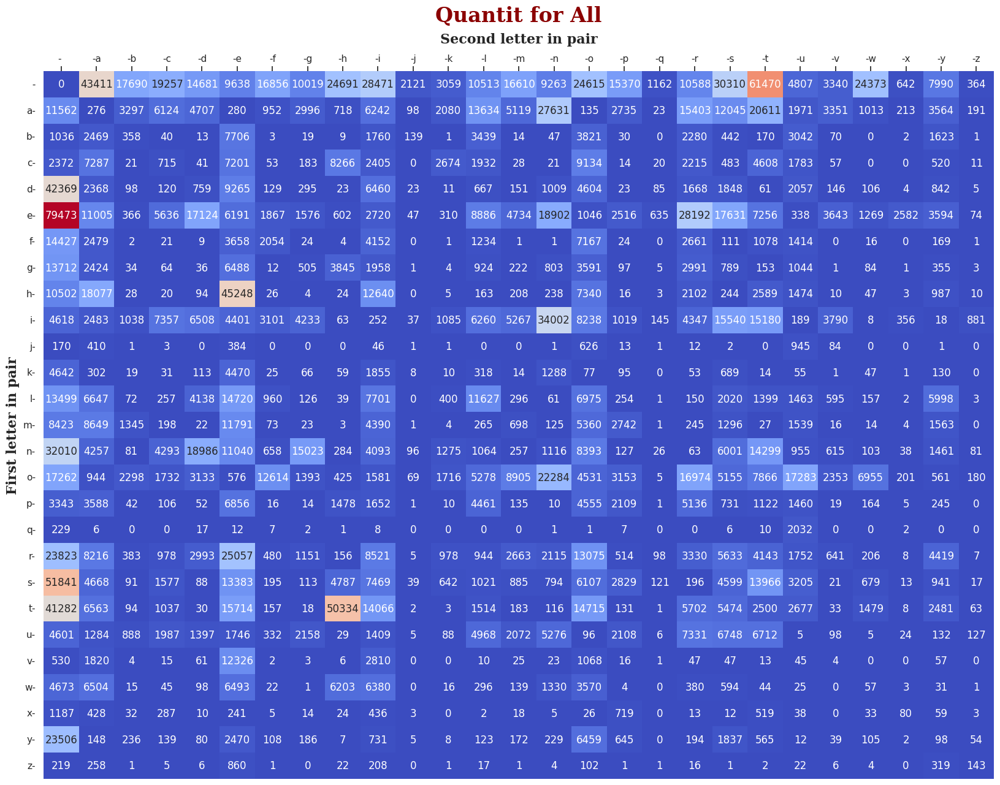

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

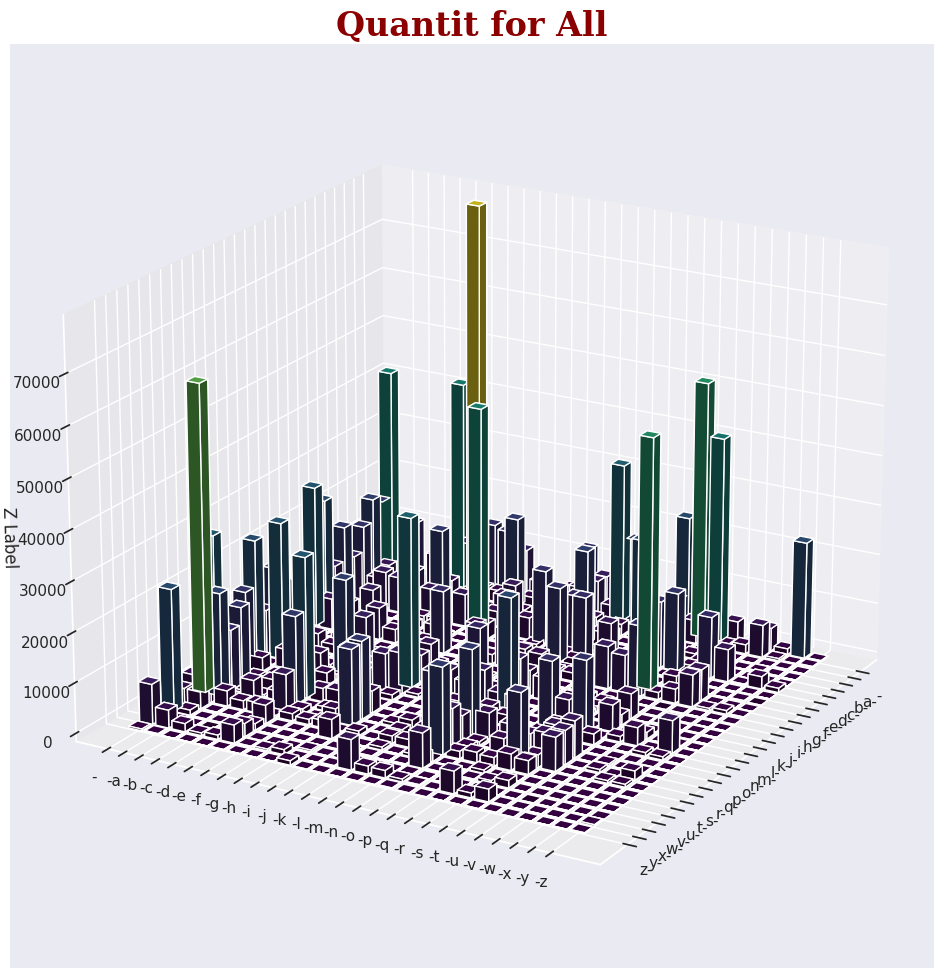

<Figure size 640x480 with 0 Axes>

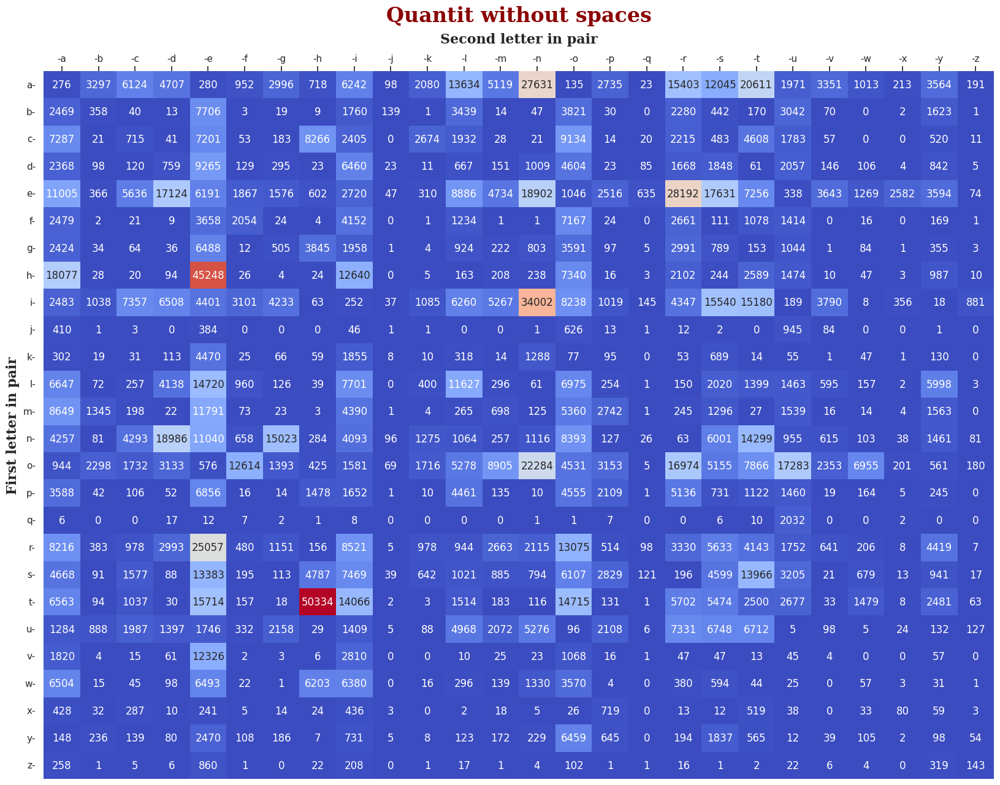

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

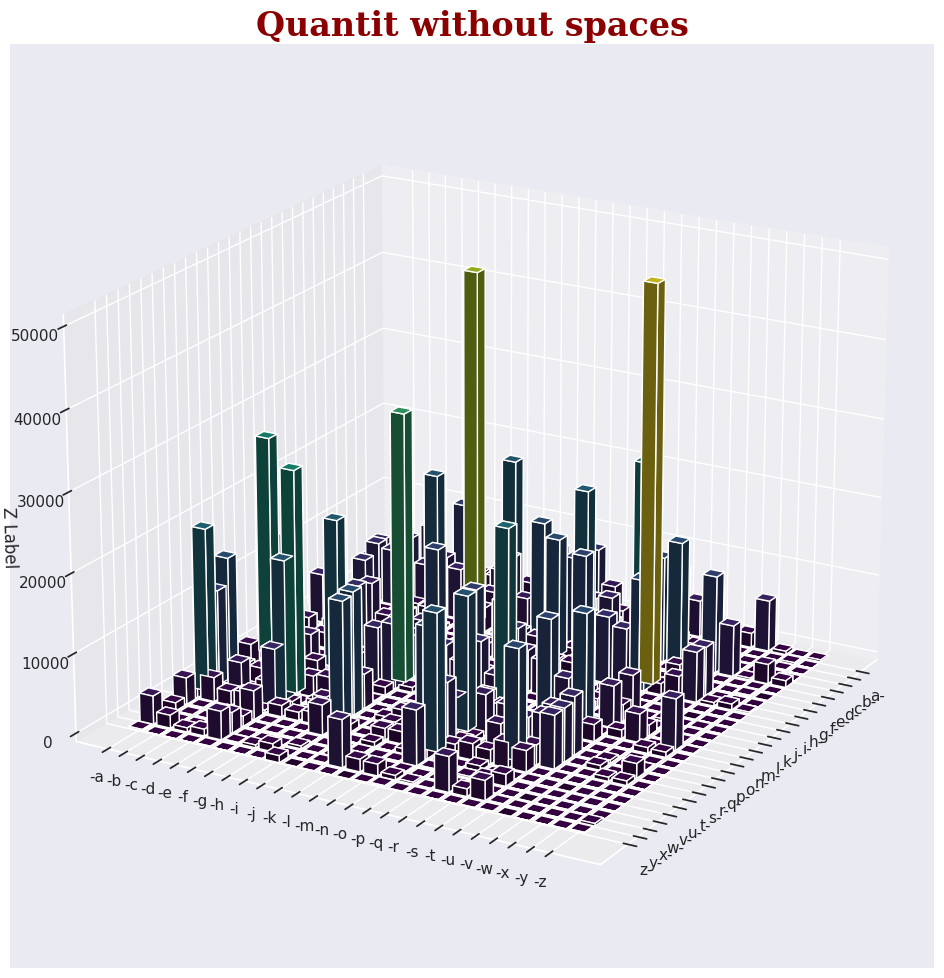

<Figure size 640x480 with 0 Axes>

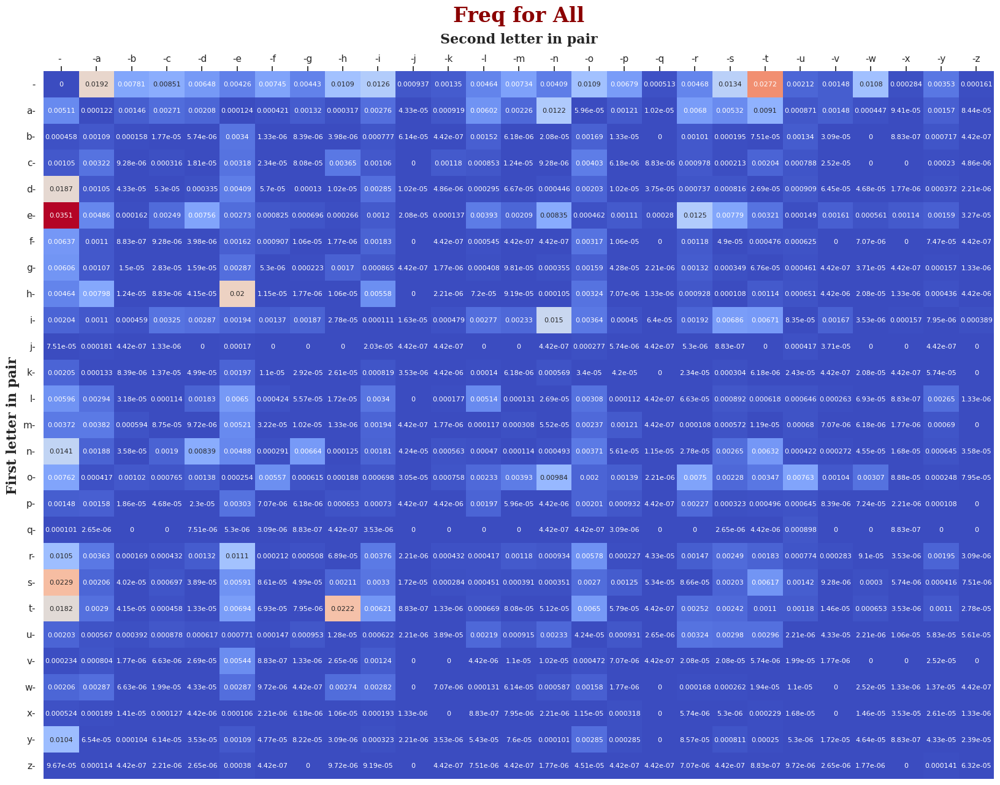

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

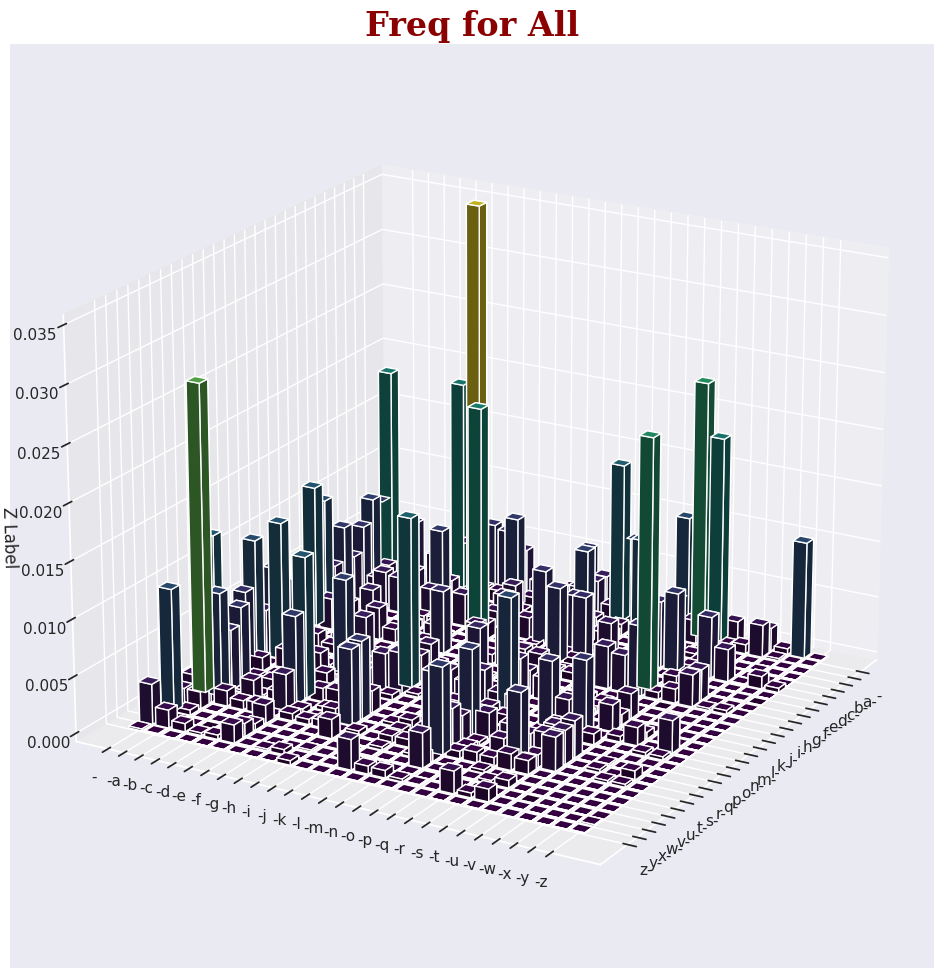

<Figure size 640x480 with 0 Axes>

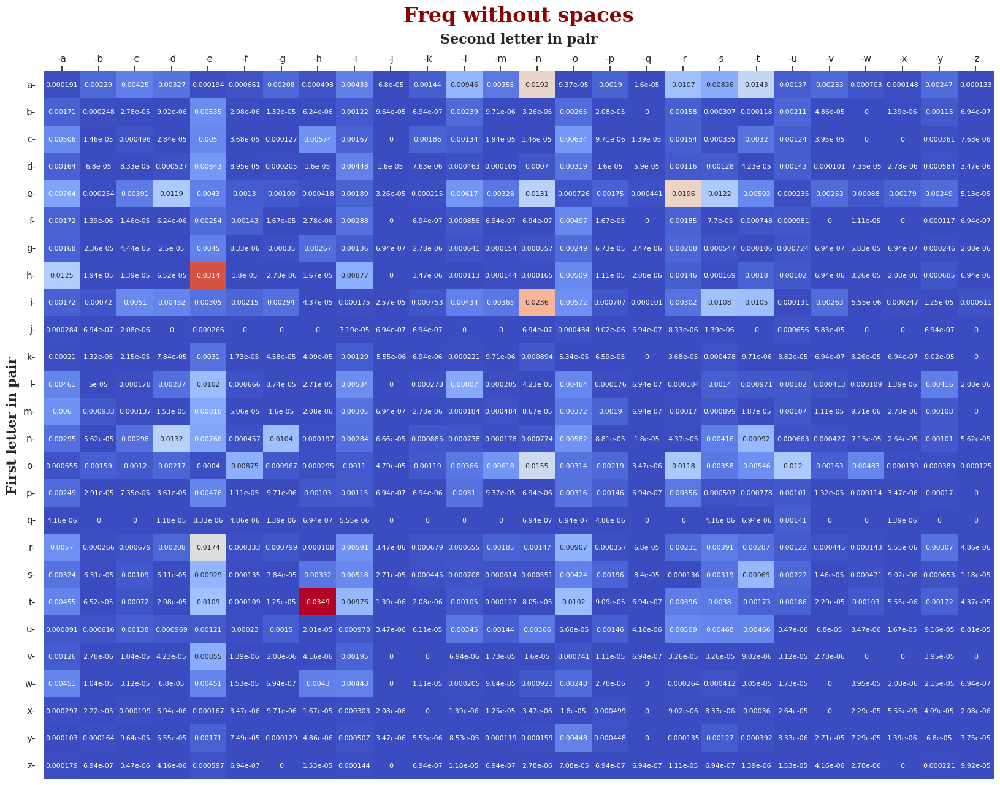

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

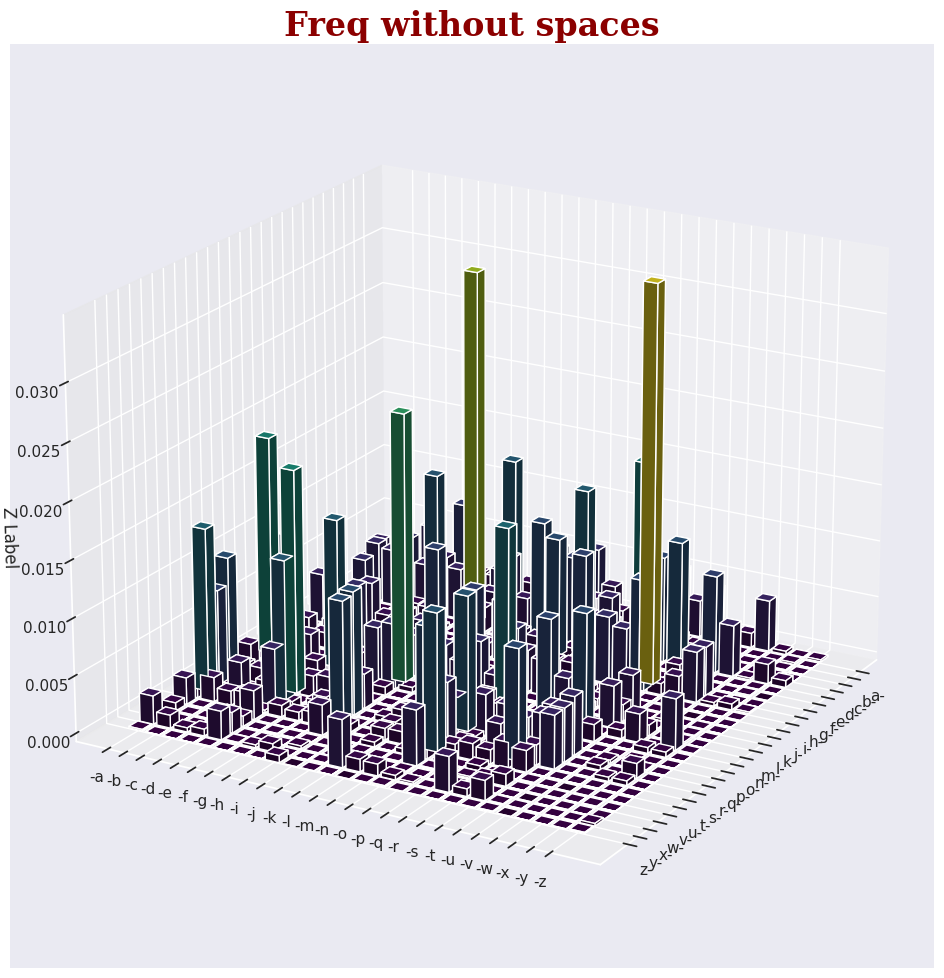

<Figure size 640x480 with 0 Axes>

In [ ]:
for dfname in freq_tables:
    ShowHeatmap(freq_tables[dfname])
    Show3DBars(freq_tables[dfname])

---
#### Biased tables



<Figure size 640x480 with 0 Axes>

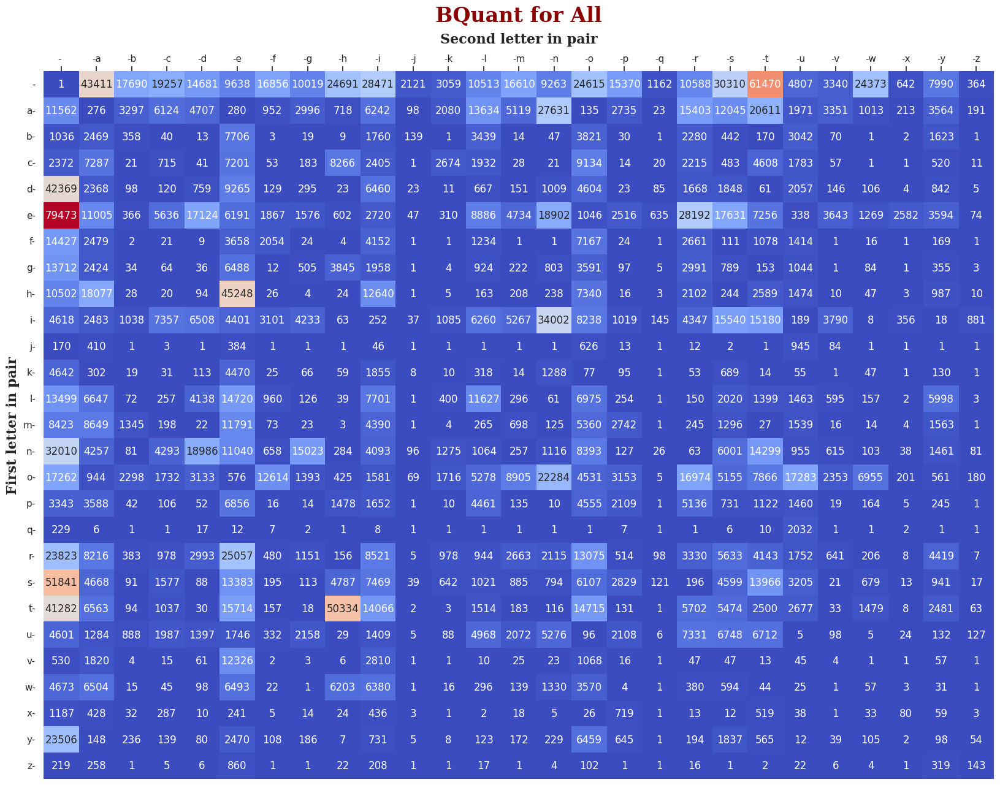

<Figure size 640x480 with 0 Axes>

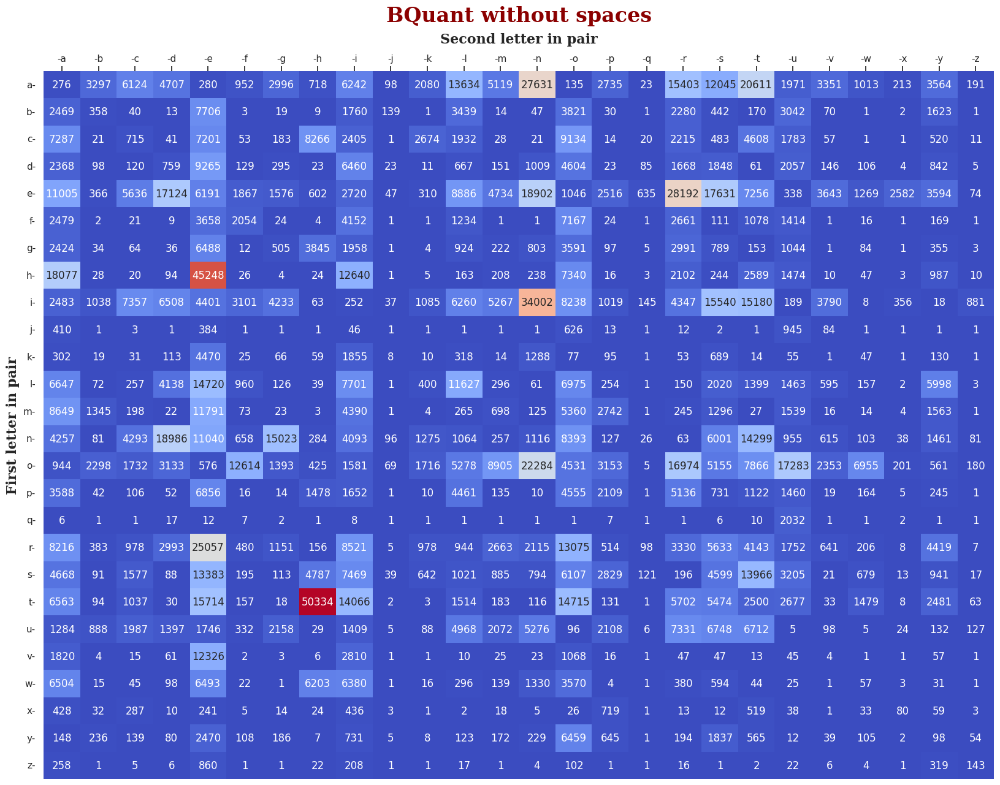

<Figure size 640x480 with 0 Axes>

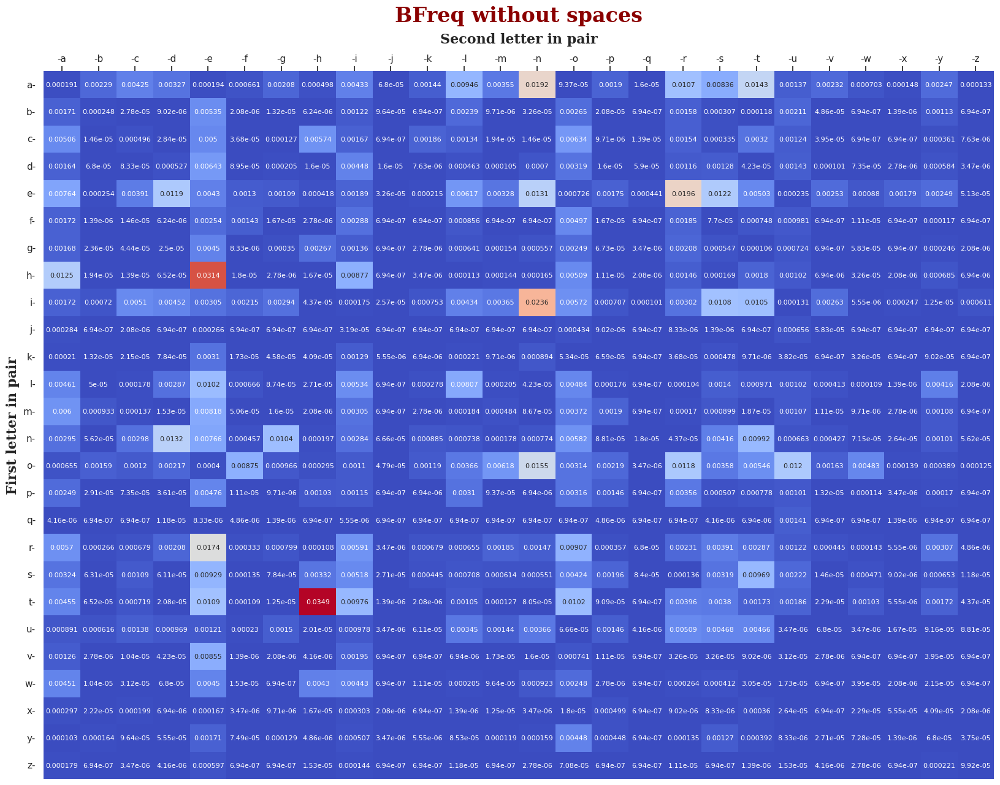

<Figure size 640x480 with 0 Axes>

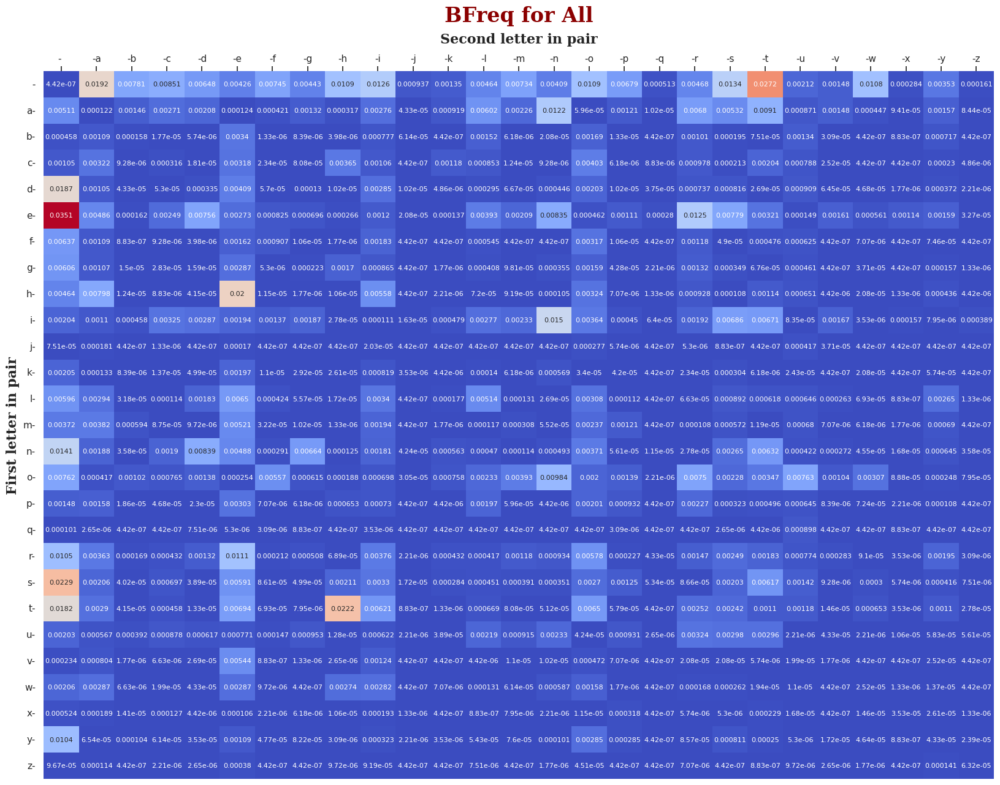

<Figure size 640x480 with 0 Axes>

In [ ]:
for dfname in bias_tables:
    ShowHeatmap(bias_tables[dfname])

---
#### Logarithmic tables

<Figure size 640x480 with 0 Axes>

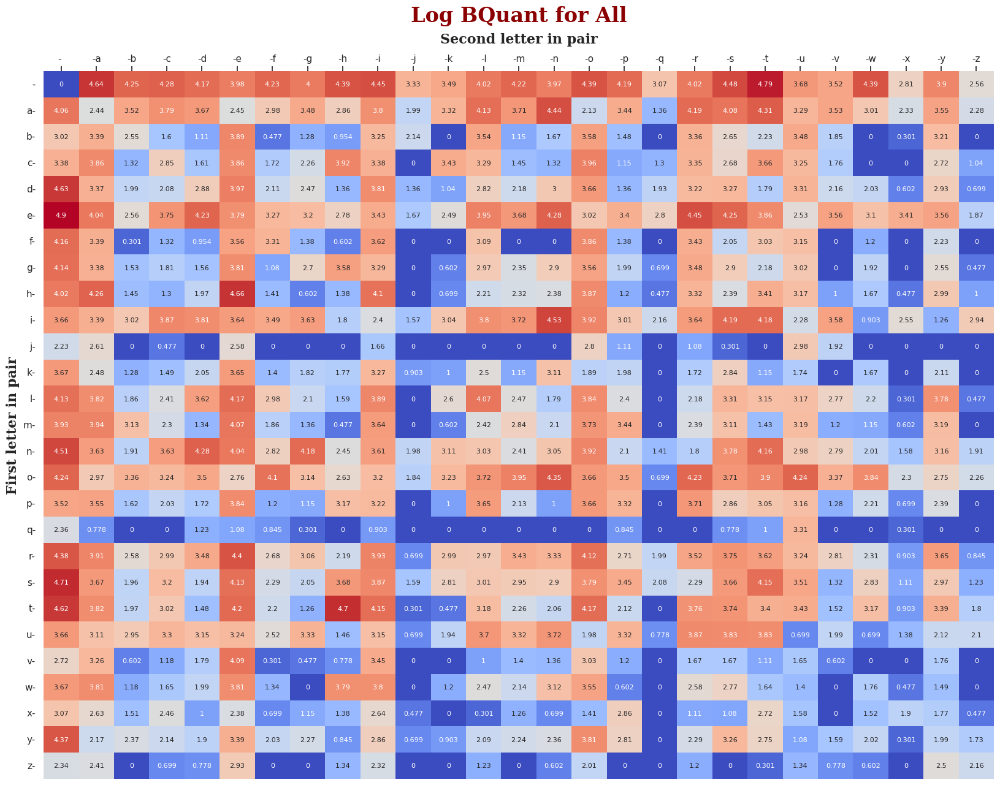

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

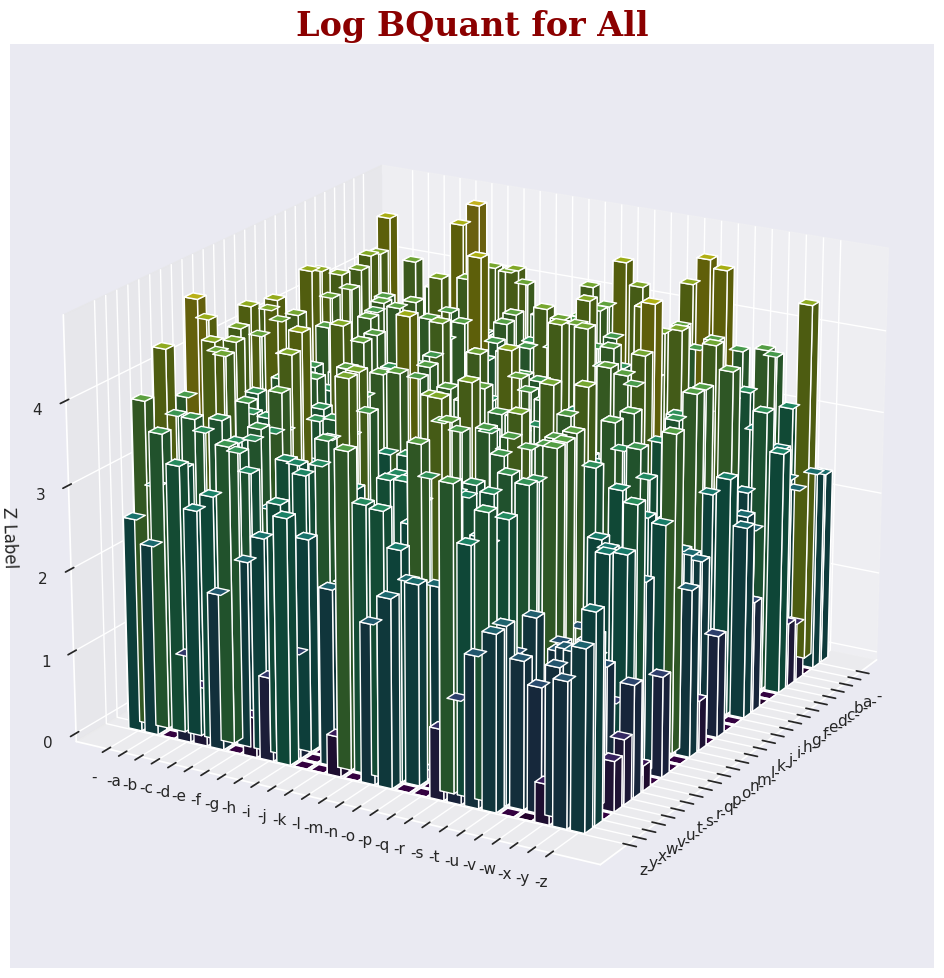

<Figure size 640x480 with 0 Axes>

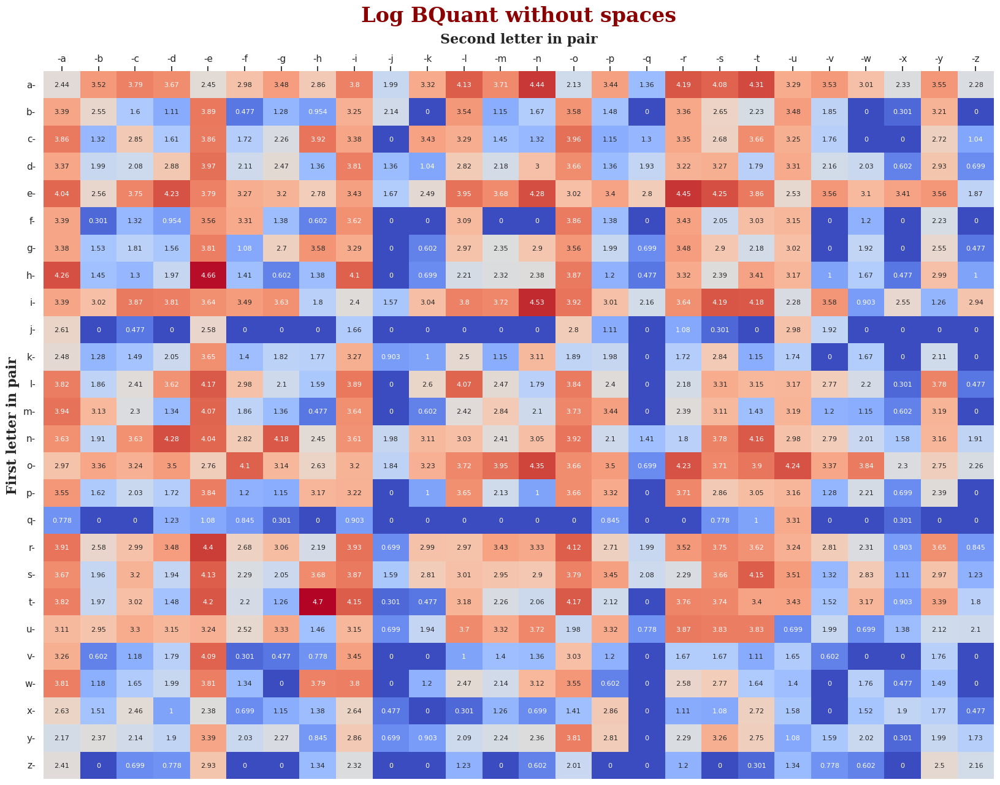

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

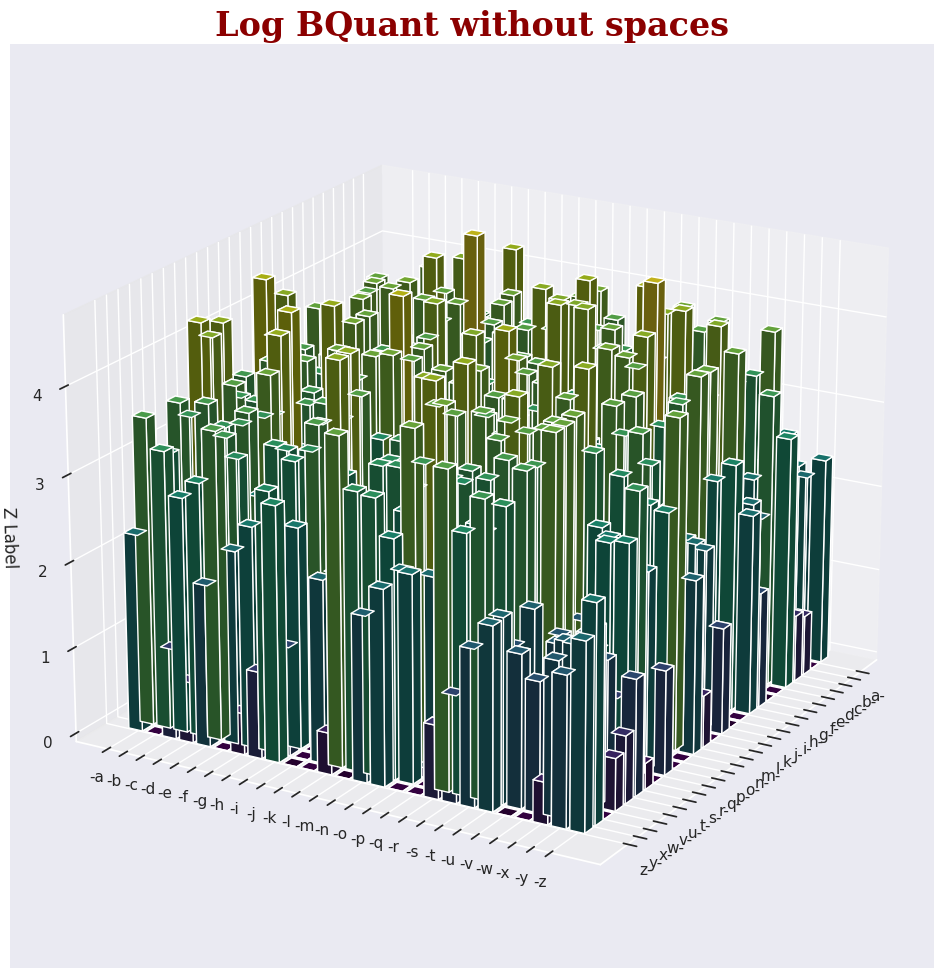

<Figure size 640x480 with 0 Axes>

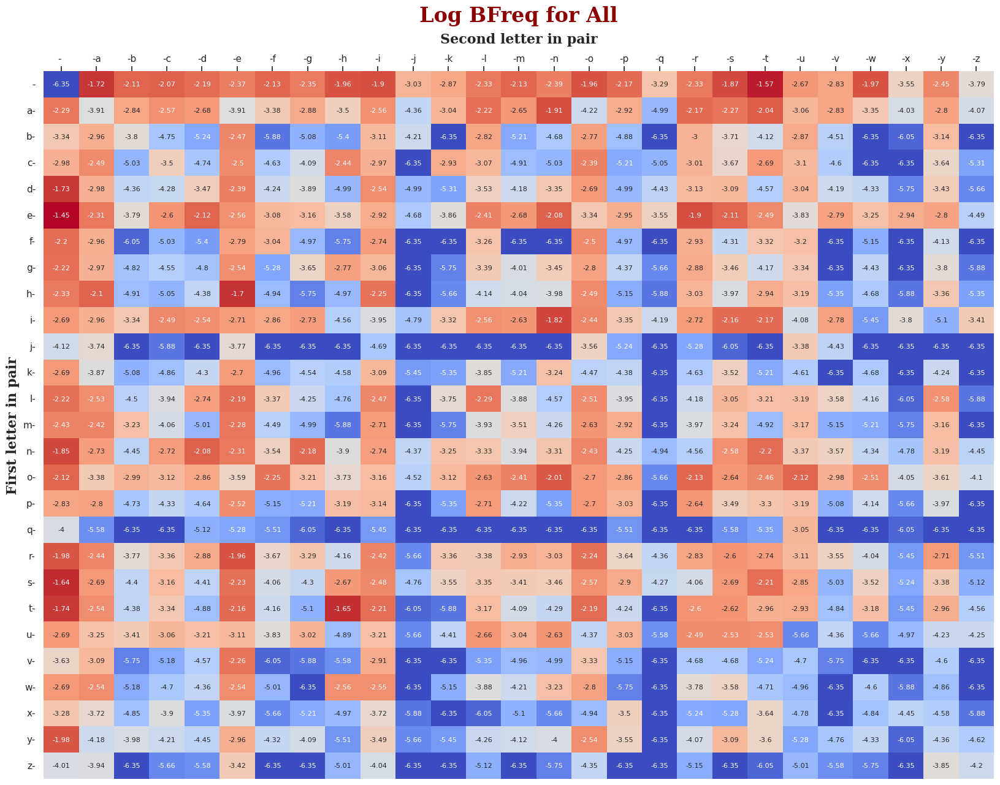

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

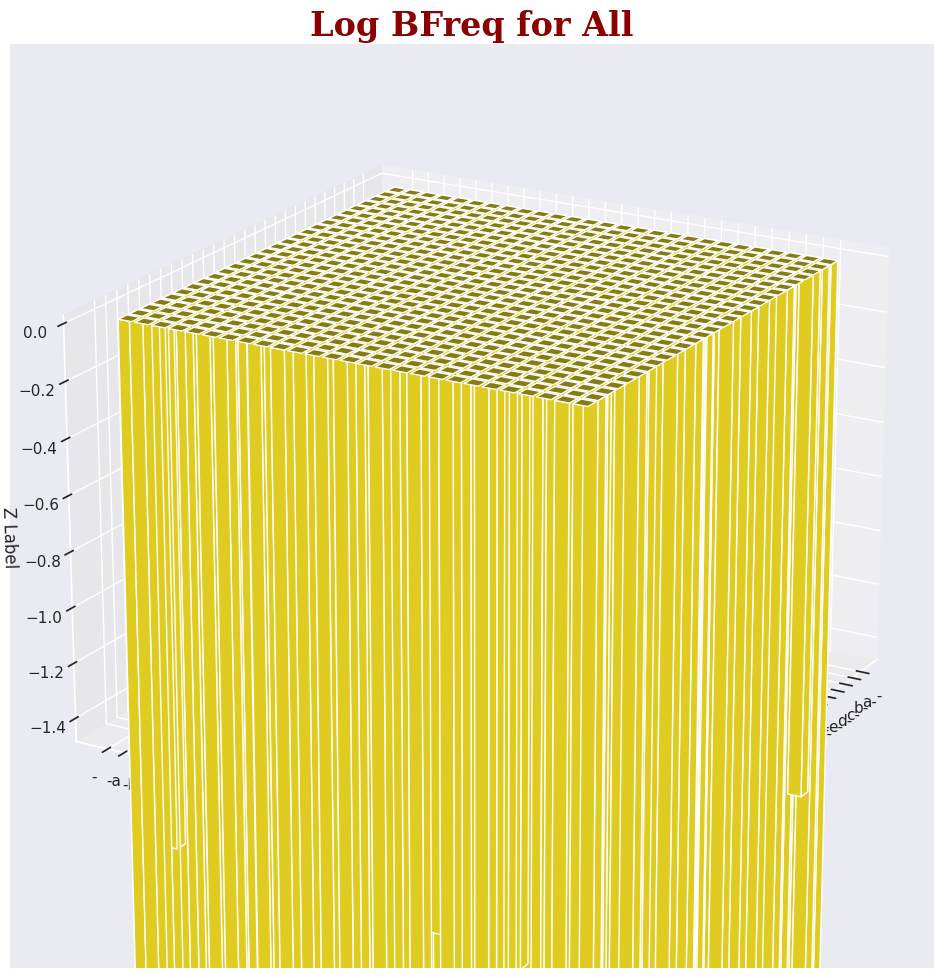

<Figure size 640x480 with 0 Axes>

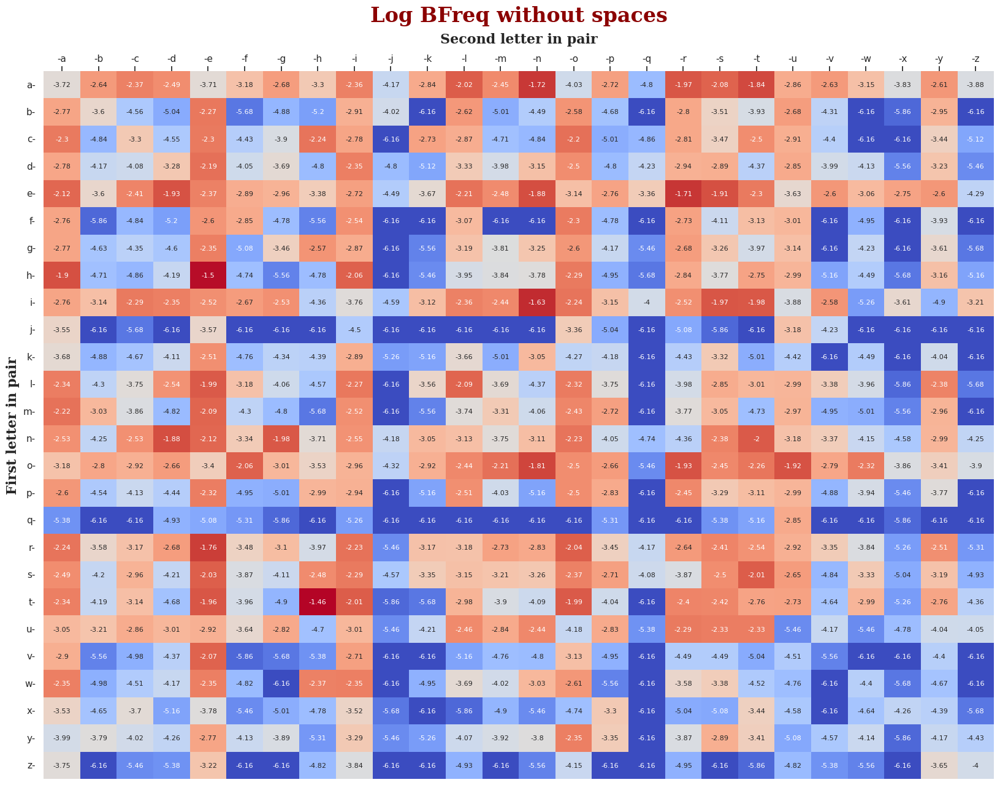

<Figure size 640x480 with 0 Axes>

<Figure size 1600x1200 with 0 Axes>

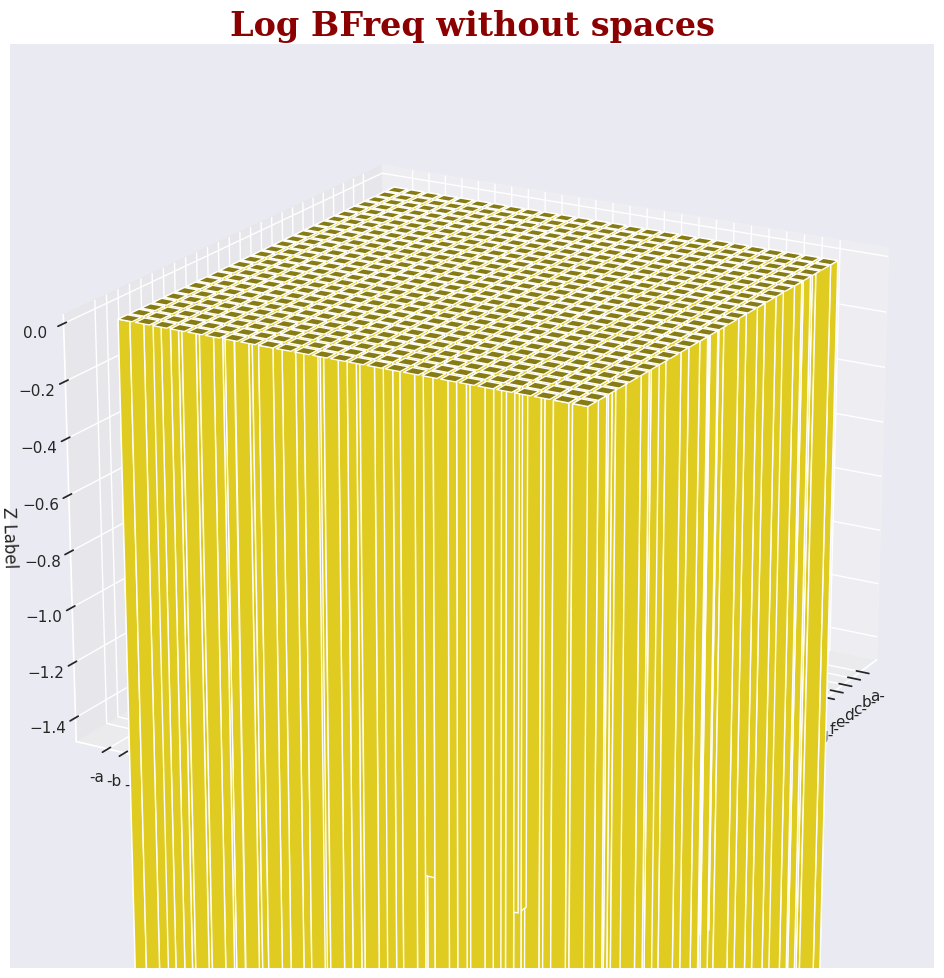

<Figure size 640x480 with 0 Axes>

In [ ]:
for dfname in log_tables:
    ShowHeatmap(log_tables[dfname])
    Show3DBars(log_tables[dfname])

---
---
---
